<a href="https://colab.research.google.com/github/EmreTomruk/MultiModal-Financial-Documents-RAG-With-Qwen2.5-VL-ColPali-Qdrant/blob/main/colpali_and_qdrant.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os


folder_path = '/content/drive/MyDrive/xx/financial-documents'
os.chdir(folder_path)
financial_documents = [f for f in os.listdir(folder_path)]
print(financial_documents)

Mounted at /content/drive
['7fa69b3ab0e21d6c7d6695d781cd448b.png', 'DCV7JUQRAUFOUZC3HZ37RB4YVA.png', '4b6c84393df1ef26f81356305cf5fba0007f8c2b_f9bcaea802f3a0a5afed32f5702d48e7.png', 'Microsoft-5-year-price-chart_2.png', 'image-350.png', 'Historical-development-of-Apple-Inc-stock-price-time-series-from-2000-to-2020-incl.png', '2024_Annual_Report.docx', 'PDFs', 'Qwen', '.gradio', 'financial_docs_index', '=0.3.1', '=4.45.0']


In [ ]:
pdf_folder_path = '/content/drive/MyDrive/xx/financial-documents/PDFs'
os.chdir(folder_path)
files = [os.path.join(pdf_folder_path, f) for f in os.listdir(pdf_folder_path) if f.endswith('.pdf')]
pdf_files = [f for f in os.listdir(pdf_folder_path)]
print(list(range(len(files))))
print(pdf_files)

[0, 1, 2, 3, 4]
['Coca-Cola 2025 Q2 Earnings Release_Full Release_7.22.25.pdf', 'unilever-charts-2015-to-2024.pdf', 'unilever-directors-remuneration-report-2024.pdf', 'TSLA-Q1-2025-Update.pdf', 'leac204.pdf']


# Colpali

In [ ]:
!pip install uv

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 129.2 MB/s eta 0:00:00


In [ ]:
!uv pip install colpali_engine==0.3.12 pdf2image==1.17.0 qwen-vl-utils==0.0.14 transformers==4.53.3 ipywidgets jinja2 einops seaborn stamina==25.1.0

Using Python 3.12.12 environment at: /usr
Resolved 137 packages in 598ms
Prepared 15 packages in 18.52s
Uninstalled 9 packages in 841ms
Installed 15 packages in 205ms
 + av==16.0.1
 + colpali-engine==0.3.12
 + jedi==0.19.2
 - nvidia-cudnn-cu12==9.10.2.21
 + nvidia-cudnn-cu12==9.5.1.17
 - nvidia-cusparselt-cu12==0.7.1
 + nvidia-cusparselt-cu12==0.6.3
 - nvidia-nccl-cu12==2.27.3
 + nvidia-nccl-cu12==2.26.2
 + pdf2image==1.17.0
 - peft==0.17.1
 + peft==0.16.0
 + qwen-vl-utils==0.0.14
 + stamina==25.1.0
 - tokenizers==0.22.1
 + tokenizers==0.21.4
 - torch==2.8.0+cu126
 + torch==2.7.1
 - torchvision==0.23.0+cu126
 + torchvision==0.22.1
 - transformers==4.57.1
 + transformers==4.53.3
 - triton==3.4.0
 + triton==3.3.1


In [ ]:
!sudo apt-get install -y poppler-utils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 38 not upgraded.
Need to get 186 kB of archives.
After this operation, 697 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 poppler-utils amd64 22.02.0-2ubuntu0.11 [186 kB]
Fetched 186 kB in 1s (317 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package poppler-utils.
(Reading database ... 126718

In [ ]:
from colpali_engine.models import ColPali, ColPaliProcessor
import torch

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model_id = "vidore/colpali-v1.2"

processor = ColPaliProcessor.from_pretrained(model_id)

model = ColPali.from_pretrained(
    model_id,
    torch_dtype=torch.bfloat16,
    device_map=device,
).eval()

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/700 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json:   0%|          | 0.00/17.8M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/733 [00:00<?, ?B/s]

adapter_config.json:   0%|          | 0.00/750 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/862M [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

adapter_model.safetensors:   0%|          | 0.00/78.6M [00:00<?, ?B/s]

## Create Embeddings


In [ ]:
from pdf2image import convert_from_path
import os

def convert_pdf_to_images(pdf_dir):
    """
    Converts all PDFs in a directory to images.

    Args:
        pdf_dir (str): Path to the directory containing PDFs.

    Returns:
        dict: A dictionary where keys are file names (without extension),
              and values are lists of images (one list per PDF).
    """
    pdf_list = [pdf for pdf in os.listdir(pdf_dir) if pdf.endswith(".pdf")]
    all_images = {}

    for pdf_file in pdf_list:
        pdf_path = os.path.join(pdf_dir, pdf_file)
        pdf_images = convert_from_path(pdf_path)
        all_images[pdf_file] = pdf_images  # file name is used as key

    return all_images

In [ ]:
pdf_folder_path = '/content/drive/MyDrive/Master/Thesis/financial-documents/PDFs'
all_images = convert_pdf_to_images(pdf_folder_path)
print(all_images.keys())

dict_keys(['Coca-Cola 2025 Q2 Earnings Release_Full Release_7.22.25.pdf', 'unilever-charts-2015-to-2024.pdf', 'unilever-directors-remuneration-report-2024.pdf', 'TSLA-Q1-2025-Update.pdf', 'leac204.pdf'])


In [ ]:
len(all_images['Coca-Cola 2025 Q2 Earnings Release_Full Release_7.22.25.pdf'])

In [ ]:
import matplotlib.pyplot as plt

for key, value in all_images.items():
    print(f"Key: {key}, Value: {value}")
    for i in range(1, len(all_images[key])):
        fig, ax = plt.subplots(figsize=(15,15))
        ax.imshow(all_images[key][i])
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.show()
    break # only check first image

In [ ]:
from torch.utils.data import DataLoader
from tqdm import tqdm

def create_document_embeddings(pdf_dir, model, processor, batch_size=2):
    """
    Converts all PDFs in a directory into embeddings with metadata.

    Args:
        pdf_dir (str): Directory containing PDF files.
        model: Pre-trained model for generating embeddings.
        processor: Preprocessor for the model (e.g., to process images).
        batch_size (int): Batch size for inference.

    Returns:
        list: A list of dictionaries, where each dictionary contains:
            - "embedding": The embedding tensor.
            - "doc_id": The document ID (int).
            - "page_id": The page index within the document.
            - "file_name": The name of the source PDF file.
    """
    all_images = convert_pdf_to_images(pdf_dir)
    all_embeddings_with_metadata = []

    for doc_id, (file_name, pdf_images) in enumerate(all_images.items()):
        dataloader = DataLoader(
            dataset=pdf_images,
            batch_size=batch_size,
            shuffle=False,
            collate_fn=lambda x: processor.process_images(x),
        )

        page_counter = 0
        for batch in tqdm(dataloader, desc=f"Processing {file_name}"):
            with torch.no_grad():
                batch = {k: v.to(model.device) for k, v in batch.items()}
                batch_embeddings = model(**batch)
                batch_embeddings = list(torch.unbind(batch_embeddings.to("cpu")))

                for embedding in batch_embeddings:
                    all_embeddings_with_metadata.append({
                        "embedding": embedding,
                        "doc_id": doc_id,
                        "page_id": page_counter,
                        "file_name": file_name,
                        "image": pdf_images[page_counter]
                    })
                    page_counter += 1

    return all_embeddings_with_metadata

In [ ]:
pdf_folder_path = '/content/drive/MyDrive/Master/Thesis/financial-documents/PDFs'
ds = create_document_embeddings(pdf_folder_path, model, processor, batch_size=2)
print(f"Generated embeddings for {len(ds)} pages.")

Processing Coca-Cola 2025 Q2 Earnings Release_Full Release_7.22.25.pdf: 100%|██████████| 16/16 [00:07<00:00,  2.08it/s]
Processing unilever-charts-2015-to-2024.pdf: 100%|██████████| 8/8 [00:03<00:00,  2.29it/s]
Processing unilever-directors-remuneration-report-2024.pdf: 100%|██████████| 12/12 [00:05<00:00,  2.15it/s]
Processing leac204.pdf: 100%|██████████| 12/12 [00:04<00:00,  2.44it/s]

Generated embeddings for 125 pages.


In [ ]:
ds[0]['embedding'].shape

torch.Size([1031, 128])

In [ ]:
ds

[{'embedding': tensor([[-0.0879, -0.0947,  0.0996,  ...,  0.0767, -0.0913,  0.0052],
          [-0.0732, -0.1328,  0.0464,  ...,  0.0522, -0.0962,  0.0203],
          [-0.0181,  0.0737,  0.1001,  ...,  0.0579,  0.0830,  0.0129],
          ...,
          [-0.0547, -0.0845,  0.1553,  ...,  0.0242, -0.0540, -0.0549],
          [-0.0801,  0.0859,  0.1436,  ...,  0.1318, -0.0400, -0.0723],
          [-0.0532,  0.1279,  0.2236,  ...,  0.0664, -0.0811, -0.1152]],
         dtype=torch.bfloat16),
  'doc_id': 0,
  'page_id': 0,
  'file_name': 'Coca-Cola 2025 Q2 Earnings Release_Full Release_7.22.25.pdf',
  'image': <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=1700x2200>},
 {'embedding': tensor([[-0.1187,  0.0366,  0.1147,  ..., -0.0498, -0.0027, -0.0264],
          [-0.0464,  0.1348,  0.1182,  ...,  0.0126,  0.0223, -0.0603],
          [ 0.0488,  0.0874,  0.0292,  ..., -0.0060, -0.0540,  0.1177],
          ...,
          [-0.0820, -0.1465,  0.1963,  ...,  0.0457, -0.0469, -0.0923],
     

In [ ]:
def get_results(query, processor, model, ds, all_images, top_k=5):
    """
    Retrieves top-k relevant images for a given query.

    Args:
        query (str): User query as a string.
        processor: Processor for pre-processing the query.
        model: Model to generate embeddings for the query.
        ds (list): List of dictionaries with "embedding", "doc_id", "page_id", and "file_name".
        all_images (dict): Dictionary of images per document.
        top_k (int): Number of top results to retrieve.

    Returns:
        list: A list of dictionaries, where each dictionary contains:
            - "doc_id": Document ID.
            - "page_id": Page ID.
            - "file_name": Name of the source PDF file.
            - "image": The retrieved image (PIL.Image.Image).
            - "score": Similarity score for the image.
    """

    batch_queries = processor.process_queries([query]).to(model.device)

    with torch.no_grad():
        query_embeddings = model(**batch_queries)

    document_embeddings = torch.stack([entry["embedding"] for entry in ds])

    similarity_scores = processor.score_multi_vector(query_embeddings, document_embeddings)
    score_values = similarity_scores[0].tolist()

    top_indices = similarity_scores[0].topk(top_k).indices.tolist()

    retrieved_results = []
    for idx in top_indices:
        entry = ds[idx]
        doc_id = entry["doc_id"]
        page_id = entry["page_id"]
        file_name = entry["file_name"]
        image = all_images[file_name][page_id]

        retrieved_results.append({
            "doc_id": doc_id,
            "page_id": page_id,
            "file_name": file_name,
            "image": image,
            "score": score_values[idx],
        })

    return retrieved_results

In [ ]:
query = "What is the role of THE COMMITTEE of Unilever?"
retrieved_results = get_results(
    query = query,
    processor=processor,
    model=model,
    ds=ds,
    all_images=all_images,
    top_k=5,
)

retrieved_results

[{'doc_id': 2,
  'page_id': 4,
  'file_name': 'unilever-directors-remuneration-report-2024.pdf',
  'image': <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=1660x2340>,
  'score': 15.3125},
 {'doc_id': 2,
  'page_id': 10,
  'file_name': 'unilever-directors-remuneration-report-2024.pdf',
  'image': <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=1660x2340>,
  'score': 12.625},
 {'doc_id': 2,
  'page_id': 2,
  'file_name': 'unilever-directors-remuneration-report-2024.pdf',
  'image': <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=1660x2340>,
  'score': 12.375},
 {'doc_id': 2,
  'page_id': 7,
  'file_name': 'unilever-directors-remuneration-report-2024.pdf',
  'image': <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=1660x2340>,
  'score': 12.0625},
 {'doc_id': 2,
  'page_id': 1,
  'file_name': 'unilever-directors-remuneration-report-2024.pdf',
  'image': <PIL.PpmImagePlugin.PpmImageFile image mode=RGB size=1660x2340>,
  'score': 11.5625}]

In [ ]:
import matplotlib.pyplot as plt

def display_top_results(retrieved_results, top=2):
    """
    Displays the top k retrieved images using Matplotlib.

    Args:
        retrieved_results (list): A list of dictionaries with metadata and images.
        top (int): The number of top results to display.

    Returns:
        None
    """
    top_k_results = retrieved_results[:top]

    fig, axes = plt.subplots(1, top, figsize=(8 * top, 8))

    if top == 1:
        axes = [axes]

    for i, result in enumerate(top_k_results):
        file_name = result["file_name"]
        page_id = result["page_id"]
        score = result["score"]
        image = result["image"]

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f"File: {file_name}\nPage: {page_id+1}\nScore: {score:.4f}")

    plt.tight_layout()
    plt.show()

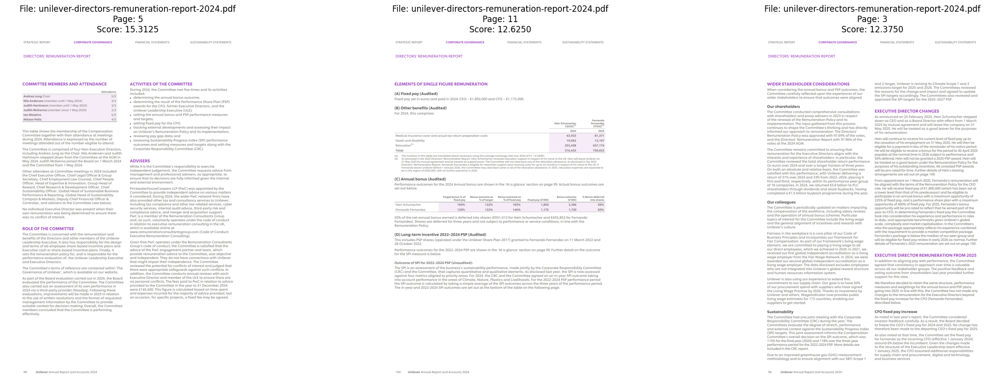

In [ ]:
display_top_results(retrieved_results, top=3)

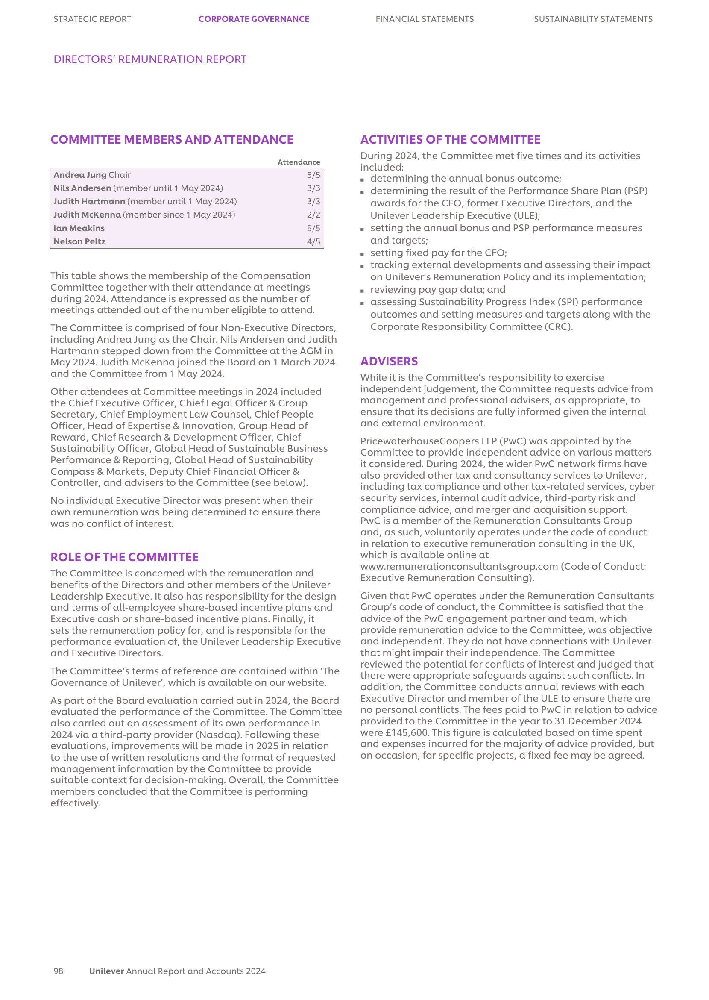

In [ ]:
image=retrieved_results[0]['image']
image

## Similarity Map

In [ ]:
from colpali_engine.interpretability import (
    get_similarity_maps_from_embeddings,
    plot_all_similarity_maps,
    plot_similarity_map,
)

In [ ]:
import pprint

def get_query_tokens(query, processor):
    batch_queries = processor.process_queries([query]).to(device)

    query_content = processor.decode(batch_queries.input_ids[0]).replace(processor.tokenizer.pad_token, "")
    query_content = query_content.replace(processor.query_augmentation_token, "").strip()
    query_tokens = processor.tokenizer.tokenize(query_content)

    return query_tokens

query_tokens = get_query_tokens(query,processor)
pprint.pprint({idx: val for idx, val in enumerate(query_tokens)})

{0: '<bos>',
 1: 'Query',
 2: ':',
 3: '▁What',
 4: '▁is',
 5: '▁the',
 6: '▁role',
 7: '▁of',
 8: '▁THE',
 9: '▁COMMITTEE',
 10: '▁of',
 11: '▁Unilever',
 12: '?'}


In [ ]:
def get_similarity_map(query, image, model, processor):
    batch_images = processor.process_images([image]).to(device)   # [B, C, 448, 448]
    batch_queries = processor.process_queries([query]).to(device) # [B, query_lenght]

    with torch.no_grad():
        image_embeddings = model.forward(**batch_images)          # [B, 1030, 128]
        query_embeddings = model.forward(**batch_queries)         # [B, query_lenght, 128]

    n_patches = processor.get_n_patches(image_size=image.size, patch_size=model.patch_size) # [32, 32]
    print(f"Number of image patches: {n_patches}")

    image_mask = processor.get_image_mask(batch_images) # Get the tensor mask to filter out the embeddings that are not related to the image

    batched_similarity_maps = get_similarity_maps_from_embeddings( # Generate the similarity maps
        image_embeddings=image_embeddings,
        query_embeddings=query_embeddings,
        n_patches=n_patches,
        image_mask=image_mask,
    )

    # Get the similarity map for the input image. Note that each token is compared to all image patches
    similarity_maps = batched_similarity_maps[0]  # (query_length, n_patches_x, n_patches_y)

    return similarity_maps

similarity_maps =  get_similarity_map(query, image, model, processor)

Number of image patches: (32, 32)


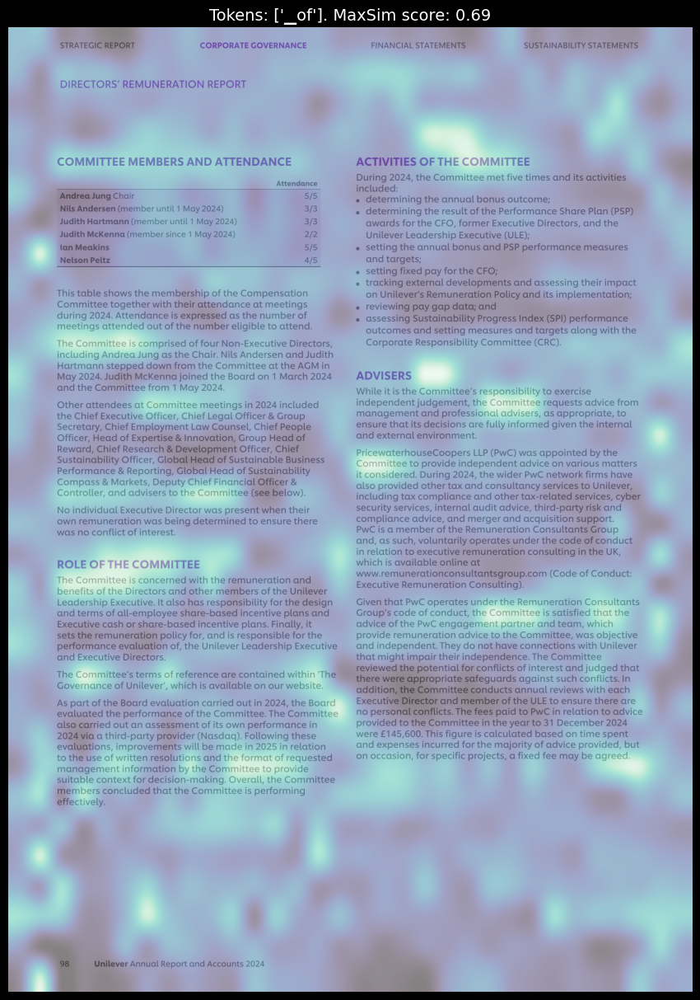

In [ ]:
def display_combined_similarity_map(similarity_maps, image, token_indices):
    """
    Display the combined similarity map for multiple tokens.

    Args:
        similarity_maps: The similarity maps tensor (query_length, n_patches_x, n_patches_y).
        image: The original image.
        token_indices: A list of token indices to combine for the similarity map.
    """
    selected_tokens = [query_tokens[idx] for idx in token_indices]
    #print(f"Selected tokens: {selected_tokens}")

    # Combine the similarity maps for the selected tokens by averaging the maps across selected tokens
    combined_similarity_map = similarity_maps[token_indices].mean(dim=0)

    fig, ax = plot_similarity_map(     # Plot the combined similarity map
        image=image,
        similarity_map=combined_similarity_map,
        figsize=(12, 12),
        show_colorbar=False,
    )

    max_sim_score = combined_similarity_map.max().item()  # note that this is the max of average similarity scores
    ax.set_title(f"Tokens: {selected_tokens}. MaxSim score: {max_sim_score:.2f}", fontsize=14)

    plt.show()

display_combined_similarity_map(similarity_maps, image, token_indices=[10])

# Qdrant

In [ ]:
!uv pip install -U qdrant-client==1.15.1

Using Python 3.12.12 environment at: /usr
Resolved 21 packages in 312ms
Prepared 7 packages in 395ms
Uninstalled 5 packages in 43ms
Installed 7 packages in 20ms
 - grpcio==1.75.1
 + grpcio==1.76.0
 - numpy==2.0.2
 + numpy==2.3.4
 + portalocker==3.2.0
 - protobuf==5.29.5
 + protobuf==6.33.0
 - pydantic==2.11.10
 + pydantic==2.12.3
 - pydantic-core==2.33.2
 + pydantic-core==2.41.4
 + qdrant-client==1.15.1


In [ ]:
from qdrant_client import QdrantClient
from qdrant_client.http.models import Distance, VectorParams, PointStruct
from google.colab import userdata
from qdrant_client.http import models

qdrant_client = QdrantClient(
    url=userdata.get('qdrantcloud_url'),
    api_key=userdata.get('qdrantcloud_apikey')
)

## Upload Qdrant


In [ ]:
collection_name = "colpali-financial-multimodal-db"
embedding_dim = 128 #ds[5]['embedding'].shape  # Use the last dimension of the embedding shape

qdrant_client.recreate_collection(
    collection_name=collection_name,
    on_disk_payload=True,  # store the payload on disk
    optimizers_config=models.OptimizersConfigDiff(
        indexing_threshold=100
    ),  # it can be useful to swith this off when doing a bulk upload and then manually trigger the indexing once the upload is done
    vectors_config=models.VectorParams(
        size=embedding_dim,
        distance=models.Distance.COSINE,
        multivector_config=models.MultiVectorConfig(
            comparator=models.MultiVectorComparator.MAX_SIM
        )
    )
)

/tmp/ipython-input-2179450139.py:4: DeprecationWarning: `recreate_collection` method is deprecated and will be removed in the future. Use `collection_exists` to check collection existence and `create_collection` instead.
  qdrant_client.recreate_collection(


True

In [ ]:
from io import BytesIO
import base64

points = []
for idx, item in enumerate(ds):
    # Convert tensor to list of lists (multi-vector format)
    vector = item['embedding'].float().tolist()  # Convert bfloat16 to float for storage
    doc_id = item['doc_id'] + 1
    unique_id = idx # Using index as unique ID for simplicity here

    # Convert PIL Image to base64 string
    buffered = BytesIO()
    item['image'].save(buffered, format="PNG") # You can choose a different format if needed
    img_str = base64.b64encode(buffered.getvalue()).decode()


    points.append(
        models.PointStruct(
            id=unique_id,
            vector=vector,
            payload={
                "doc_id": item['doc_id'],
                "page_id": item['page_id'],
                "file_name": item['file_name'],
                "image_base64": img_str # Store base64 string instead of image object
            }
        )
    )

In [ ]:
import stamina

@stamina.retry(on=Exception, attempts=3)
def upsert_to_qdrant(batch):
    try:
        qdrant_client.upsert(
            collection_name=collection_name,
            points=batch, # Use batch here instead of points
            wait=False,
        )
    except Exception as e:
        print(f"Error during upsert: {e}")
        return False
    return True

In [ ]:
# Batch upsert (adjust batch_size if needed)
batch_size = 2
for i in range(0, len(points), batch_size):
    batch = points[i:i + batch_size]
    upsert_to_qdrant(batch) # Call the modified upsert function


print(f"Inserted {len(points)} pages into Qdrant collection '{collection_name}'.")

Inserted 125 pages into Qdrant collection 'colpali-financial-multimodal-db'.


## Query From Qdrant

In [ ]:
import torch

def retrieve_relevant_docs(query_text, collection_name="colpali-financial-multimodal-db", top_k=3):
    # Process query text to multi-vector embedding
    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    inputs = processor.process_queries([query_text]).to(device)
    with torch.no_grad():
        query_emb = model(**inputs)[0].to("cpu").float()  # Shape: (num_query_tokens, 128)

    hits = qdrant_client.query_points(     # Search in Qdrant using MaxSim
        collection_name=collection_name,
        query=query_emb.tolist(),
        limit=top_k,
        with_payload=True
    ).points

    results = [
        {
            "score": hit.score,
            "id": hit.id,
            "payload": hit.payload,
            "image": hit.payload['image_base64']
        }
        for hit in hits
    ]
    return results

In [ ]:
result = retrieve_relevant_docs("What is the role of THE COMMITTEE of Unilever?")
result

[{'score': 15.309468,
  'id': 50,
  'payload': {'doc_id': 2,
   'page_id': 4,
   'file_name': 'unilever-directors-remuneration-report-2024.pdf',
   'image_base64': 'iVBORw0KGgoAAAANSUhEUgAABnwAAAkkCAIAAAC5jEbjAAEAAElEQVR4nOzdZXwc16H38bMsZmaWLJmZOXY4jsPYNtC0TZs2aZtbuH3aC21vmdtgg22Y4ziOnZhBkmVbtpiZWStYLT0vRlmtV7urlTyGJL/vRy+k0czs7NmZ2Zn/HFBYrVYBAAAAAAAAQD7Ki70BAAAAAAAAwOcNoRsAAAAAAAAgM0I3AAAAAAAAQGaEbgAAAAAAAIDMCN0AAAAAAAAAmRG6AQAAAAAAADIjdAMAAAAAAABkRugGAAAAAAAAyIzQDQAAAAAAAJAZoRsAAAAAAAAgM0I3AAAAAAAAQGaEbgAAAAAAAIDMCN0AAAAAAAAAmRG6AQAAAAAAADIjdAMAAAAAAABkRugGAAAAAAAAyIzQDQAAAAAAAJAZoRsAAAAAAAAgM0I3AAAAAAAAQGaEbgAAAAAAAIDMCN0AAAAAAAAAmRG6AQAAAAAAADIjdAMAAAAAAABkRugGAAAAAAAAyIzQDQAAAAAAAJAZoRsAAAAAAAAgM0I3AAAAAAAAQGaEbgAAAAAAAIDMCN0AAAAAAAAAmRG6AQAAAAAAADIjdAMAAAAAAABkRugGAAAAAAAAyIzQDQAAAAAAAJAZoRsAAAAAAAAgM0I3AAAAAAAAQGaEbpcKq9V6sTcBAAAAFx+XhfKiPD8fZPwc2SUuBXwK8qI8L1nqi70BX3SFp04e2L+vqbHRarUGBQVFx8QsWLh4/oIFQoiX/vVie3ub06WSkpK3bb+hv6/vmX8+ZZuo0+kiIiKXLFuWkJDodKnKivId77+nEIp7v/qAn5+fbbr

# Gradio Server

In [ ]:
!uv pip install -U gradio

Using Python 3.12.12 environment at: /usr
Resolved 56 packages in 302ms
Prepared 14 packages in 537ms
Uninstalled 13 packages in 76ms
Installed 14 packages in 47ms
 + annotated-doc==0.0.3
 - fastapi==0.119.1
 + fastapi==0.120.0
 - ffmpy==0.6.3
 + ffmpy==0.6.4
 - fsspec==2025.3.0
 + fsspec==2025.9.0
 - hf-xet==1.1.10
 + hf-xet==1.2.0
 - huggingface-hub==0.35.3
 + huggingface-hub==0.36.0
 - orjson==3.11.3
 + orjson==3.11.4
 - pandas==2.2.2
 + pandas==2.3.3
 - pydantic==2.12.3
 + pydantic==2.11.10
 - pydantic-core==2.41.4
 + pydantic-core==2.33.2
 - requests==2.32.4
 + requests==2.32.5
 - rich==13.9.4
 + rich==14.2.0
 - ruff==0.14.1
 + ruff==0.14.2
 - safehttpx==0.1.6
 + safehttpx==0.1.7


In [ ]:
import gradio as gr

iface = gr.Interface(
    fn=retrieve_relevant_docs,
    inputs=[
            gr.Textbox(label="Enter your query:"),
            gr.Textbox(label="Enter your collection name:"),
            gr.Slider(1, 10, value=3, step=1, label="Number of Documents (k)")
    ],
    outputs=gr.JSON(label="Retrieved Documents"),
    title="Document Retrieval with ColPali and Qdrant",
    description="Enter a query to retrieve relevant financial document pages from the Qdrant database."
)

In [ ]:
share_url = iface.launch(share=True, debug=True)
print(f"🚀 Gradio API available at: {share_url}")